<a href="https://colab.research.google.com/github/rzunick/MNA-Proyecto-Integrador-Equipo-43/blob/main/Avance_1_Equipo_43.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#Portada
Instituto Tecnológico de Estudios Superiores de Monterrey

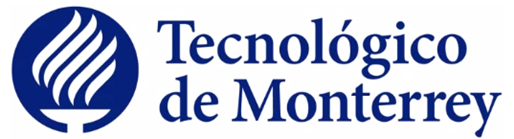

Maestría en Inteligencia Artificial Aplicada (MNA)
Curso: TC5035 Proyecto Integrador

Profesores: Dra. Grettel Barceló Alonso y Dr. Luis Eduardo Falcón

Proyecto: Reconocimiento y Clasificación de Objetos basado en Colores para Detección en Vivo en Cámaras de Seguridad
##Avance 1. Análisis exploratorio de datos


Equipo 43
* Ronald David Zuniga Sanchez - A01686240

#1 - Introducción

Este primer avance consiste en realizar un análisis exploratorio de datos (EDA - Exploratory Data Analysis), es decir, describir los datos utilizando técnicas estadísticas y de visualización (análisis univariante y bi/multivariante) para hacer enfoque en sus aspectos más relevantes, así como aplicar y justificar operaciones de preprocesamiento, relacionadas con el manejo de valores faltantes, atípicos y alta cardinalidad.

**Contexto del Proyecto**

**Selección de Dataset**

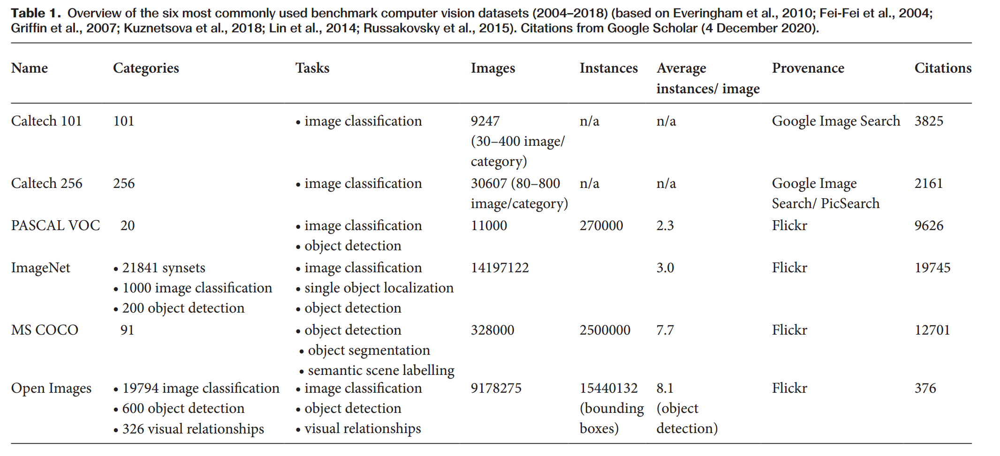

**Descripción de Dataset Seleccionado - Common Objects in Context (COCO)**

#2 - Importando el Dataset

##Instalación de dependencias

In [ ]:
# Instalar aplicación y libreriás de Fifty One para la importación y análisis del dataset.
!pip install fiftyone

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.9/7.9 MB 17.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 42.6/42.6 kB 3.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 139.3/139.3 kB 6.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 54.4/54.4 kB 7.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 59.9/59.9 kB 8.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.9/79.9 MB 21.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 108.9/108.9 kB 15.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 74.3/74.3 kB 10.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 670.0/670.0 kB 9.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 71.9/71.9 kB 10.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 192.5/192.5 kB 26.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 89.6/89.6 kB 12.9 MB/s eta 0:00:00
  Installing build dependen

**Instalación de dependencias para Clustering Analysis**

In [34]:
!pip install -U scikit-learn fiftyone

  Using cached scikit_learn-1.4.2-cp310-cp310-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (12.1 MB)


In [22]:
!fiftyone plugins download https://github.com/jacobmarks/clustering-plugin


Copying plugin '@jacobmarks/clustering' to '/root/fiftyone/__plugins__/@jacobmarks/clustering'


In [23]:
!pip install umap-learn git+https://github.com/openai/CLIP.git

  Cloning https://github.com/openai/CLIP.git to /tmp/pip-req-build-byhafaic
  Running command git clone --filter=blob:none --quiet https://github.com/openai/CLIP.git /tmp/pip-req-build-byhafaic
  Resolved https://github.com/openai/CLIP.git to commit a1d071733d7111c9c014f024669f959182114e33
  Preparing metadata (setup.py) ... done
  Created wheel for clip: filename=clip-1.0-py3-none-any.whl size=1369499 sha256=395eb053ad56859c35973f911669bed3da32231930d6412be653a32d65963453
  Stored in directory: /tmp/pip-ephem-wheel-cache-0_qnr48c/wheels/da/2b/4c/d6691fa9597aac8bb85d2ac13b112deb897d5b50f5ad9a37e4
Successfully built clip


In [ ]:
# Carga de aplicación y herramienta de importación de datasets de Fifty One.
import fiftyone as fo
import fiftyone.zoo as foz

Migrating database to v0.23.8


INFO:fiftyone.migrations.runner:Migrating database to v0.23.8


In [35]:
import fiftyone.brain as fob
from fiftyone import ViewField as F

ImportError: cannot import name '_fit_context' from 'sklearn.base' (/usr/local/lib/python3.10/dist-packages/sklearn/base.py)

## COCO Dataset - Train Split

In [ ]:
# Download and load the train split of COCO-2017
dataset_train = foz.load_zoo_dataset("coco-2017", split="train")

INFO:fiftyone.zoo.datasets:Downloading split 'train' to '/root/fiftyone/coco-2017/train' if necessary


INFO:fiftyone.utils.coco:Downloading annotations to '/root/fiftyone/coco-2017/tmp-download/annotations_trainval2017.zip'


 100% |██████|    1.9Gb/1.9Gb [16.7s elapsed, 0s remaining, 128.9Mb/s]      


INFO:eta.core.utils: 100% |██████|    1.9Gb/1.9Gb [16.7s elapsed, 0s remaining, 128.9Mb/s]      


Extracting annotations to '/root/fiftyone/coco-2017/raw/instances_train2017.json'


INFO:fiftyone.utils.coco:Extracting annotations to '/root/fiftyone/coco-2017/raw/instances_train2017.json'


INFO:fiftyone.utils.coco:Downloading images to '/root/fiftyone/coco-2017/tmp-download/train2017.zip'


 100% |████|  144.1Gb/144.1Gb [20.1m elapsed, 0s remaining, 128.1Mb/s]      


INFO:eta.core.utils: 100% |████|  144.1Gb/144.1Gb [20.1m elapsed, 0s remaining, 128.1Mb/s]      


Extracting images to '/root/fiftyone/coco-2017/train/data'


INFO:fiftyone.utils.coco:Extracting images to '/root/fiftyone/coco-2017/train/data'


Writing annotations to '/root/fiftyone/coco-2017/train/labels.json'


INFO:fiftyone.utils.coco:Writing annotations to '/root/fiftyone/coco-2017/train/labels.json'


Dataset info written to '/root/fiftyone/coco-2017/info.json'


INFO:fiftyone.zoo.datasets:Dataset info written to '/root/fiftyone/coco-2017/info.json'


Loading 'coco-2017' split 'train'


INFO:fiftyone.zoo.datasets:Loading 'coco-2017' split 'train'


 100% |███████████| 118287/118287 [11.4m elapsed, 0s remaining, 190.3 samples/s]      


INFO:eta.core.utils: 100% |███████████| 118287/118287 [11.4m elapsed, 0s remaining, 190.3 samples/s]      


Dataset 'coco-2017-train' created


INFO:fiftyone.zoo.datasets:Dataset 'coco-2017-train' created


In [ ]:
# Resumen general del dataset split creado
print(dataset_train)

Name:        coco-2017-train
Media type:  image
Num samples: 118287
Persistent:  False
Tags:        []
Sample fields:
    id:           fiftyone.core.fields.ObjectIdField
    filepath:     fiftyone.core.fields.StringField
    tags:         fiftyone.core.fields.ListField(fiftyone.core.fields.StringField)
    metadata:     fiftyone.core.fields.EmbeddedDocumentField(fiftyone.core.metadata.ImageMetadata)
    ground_truth: fiftyone.core.fields.EmbeddedDocumentField(fiftyone.core.labels.Detections)


In [ ]:
# Ejecución de aplicación FiftyOne App para exploración visual de dataset
session = fo.launch_app(dataset_train)

**Capturas de Exploración inicial**

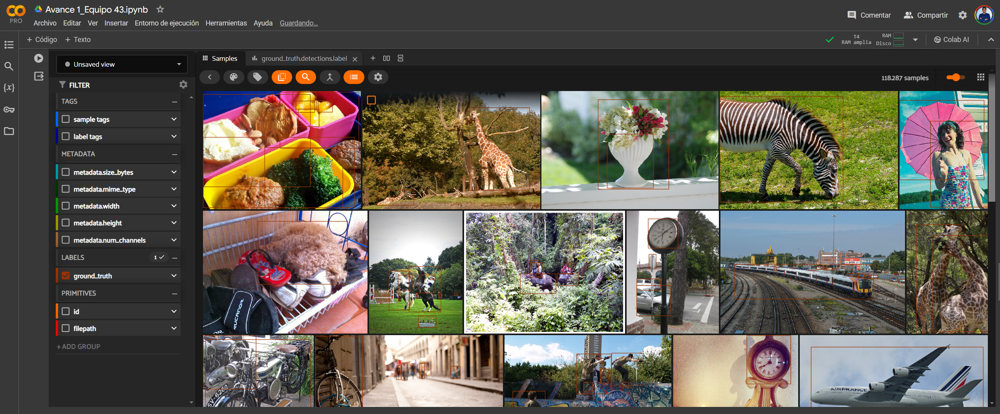

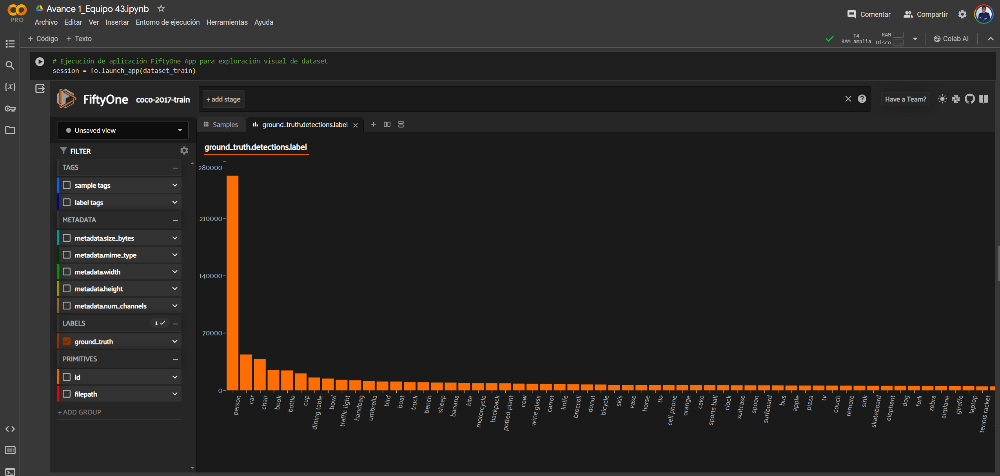

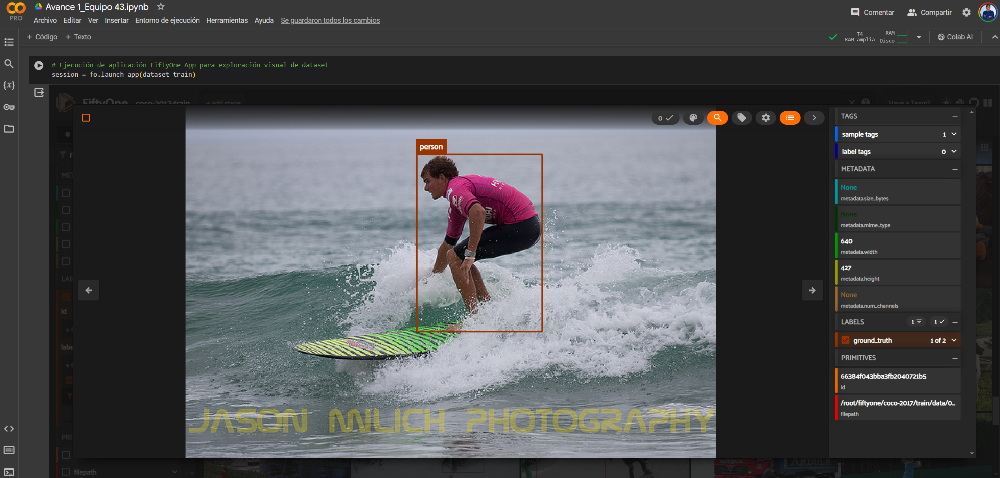

## COCO Dataset - Validation Split

In [ ]:
# Download and load the validation split of COCO-2017
dataset_val = foz.load_zoo_dataset("coco-2017", split="validation")

INFO:fiftyone.zoo.datasets:Downloading split 'validation' to '/root/fiftyone/coco-2017/validation' if necessary


Found annotations at '/root/fiftyone/coco-2017/raw/instances_val2017.json'


INFO:fiftyone.utils.coco:Found annotations at '/root/fiftyone/coco-2017/raw/instances_val2017.json'


INFO:fiftyone.utils.coco:Downloading images to '/root/fiftyone/coco-2017/tmp-download/val2017.zip'


 100% |██████|    6.1Gb/6.1Gb [51.6s elapsed, 0s remaining, 135.2Mb/s]      


INFO:eta.core.utils: 100% |██████|    6.1Gb/6.1Gb [51.6s elapsed, 0s remaining, 135.2Mb/s]      


Extracting images to '/root/fiftyone/coco-2017/validation/data'


INFO:fiftyone.utils.coco:Extracting images to '/root/fiftyone/coco-2017/validation/data'


Writing annotations to '/root/fiftyone/coco-2017/validation/labels.json'


INFO:fiftyone.utils.coco:Writing annotations to '/root/fiftyone/coco-2017/validation/labels.json'


Dataset info written to '/root/fiftyone/coco-2017/info.json'


INFO:fiftyone.zoo.datasets:Dataset info written to '/root/fiftyone/coco-2017/info.json'


Loading 'coco-2017' split 'validation'


INFO:fiftyone.zoo.datasets:Loading 'coco-2017' split 'validation'


 100% |███████████████| 5000/5000 [27.0s elapsed, 0s remaining, 179.1 samples/s]      


INFO:eta.core.utils: 100% |███████████████| 5000/5000 [27.0s elapsed, 0s remaining, 179.1 samples/s]      


Dataset 'coco-2017-validation' created


INFO:fiftyone.zoo.datasets:Dataset 'coco-2017-validation' created


In [ ]:
# Resumen general del dataset split creado
print(dataset_val)

Name:        coco-2017-validation
Media type:  image
Num samples: 5000
Persistent:  False
Tags:        []
Sample fields:
    id:           fiftyone.core.fields.ObjectIdField
    filepath:     fiftyone.core.fields.StringField
    tags:         fiftyone.core.fields.ListField(fiftyone.core.fields.StringField)
    metadata:     fiftyone.core.fields.EmbeddedDocumentField(fiftyone.core.metadata.ImageMetadata)
    ground_truth: fiftyone.core.fields.EmbeddedDocumentField(fiftyone.core.labels.Detections)


In [20]:
# Ejecución de aplicación FiftyOne App para exploración visual de dataset
session = fo.launch_app(dataset_val)

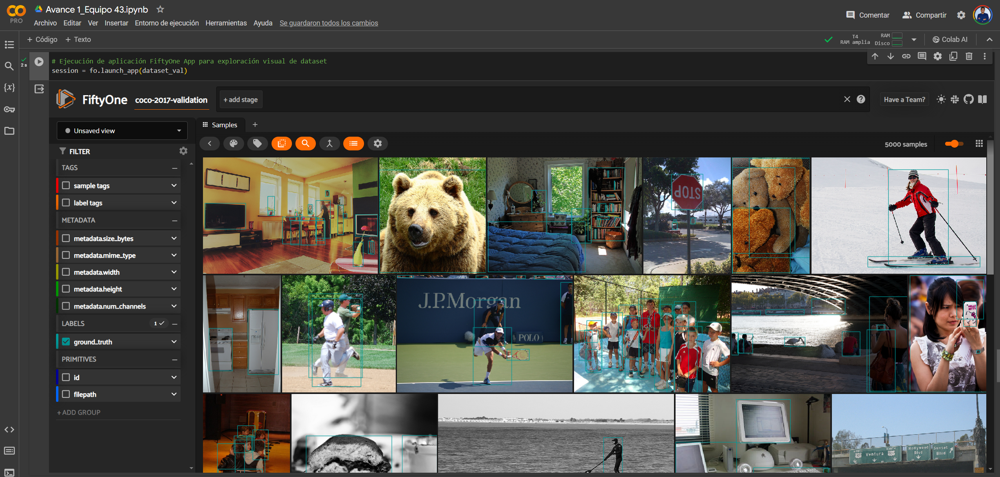

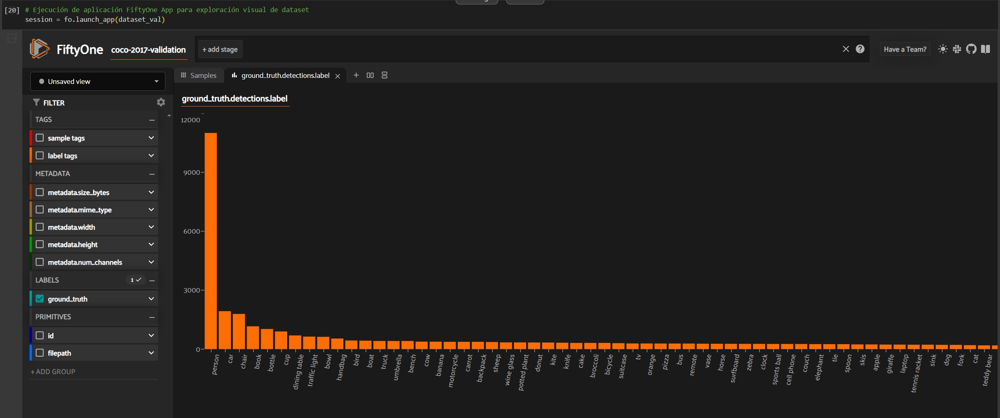

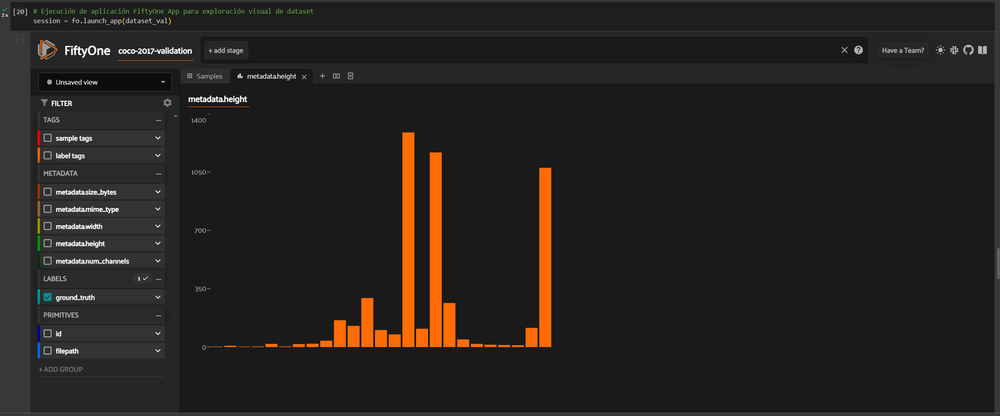

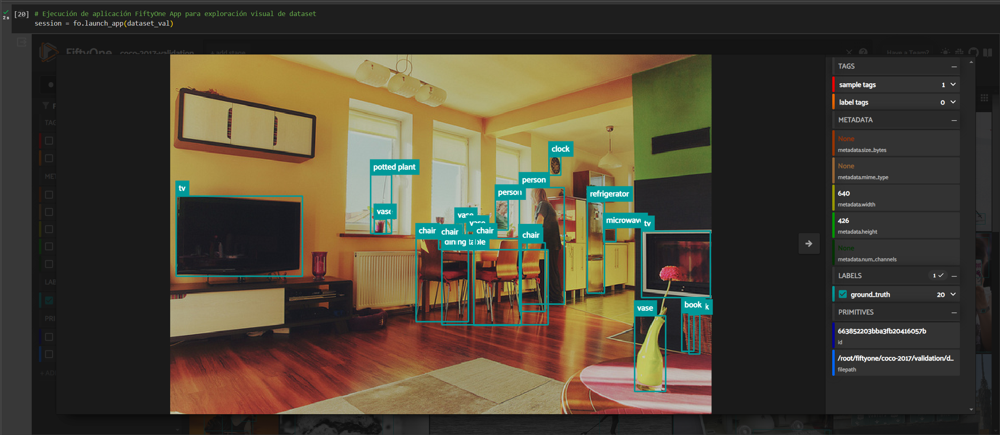

## COCO Dataset - Test Split

In [ ]:
# Download and load the test split of COCO-2017
dataset_test = foz.load_zoo_dataset("coco-2017", split="test")

INFO:fiftyone.zoo.datasets:Downloading split 'test' to '/root/fiftyone/coco-2017/test' if necessary


INFO:fiftyone.utils.coco:Downloading test info to '/root/fiftyone/coco-2017/tmp-download/image_info_test2017.zip'


 100% |██████|    8.7Mb/8.7Mb [1.1s elapsed, 0s remaining, 8.0Mb/s]      


INFO:eta.core.utils: 100% |██████|    8.7Mb/8.7Mb [1.1s elapsed, 0s remaining, 8.0Mb/s]      


Extracting test info to '/root/fiftyone/coco-2017/raw/image_info_test2017.json'


INFO:fiftyone.utils.coco:Extracting test info to '/root/fiftyone/coco-2017/raw/image_info_test2017.json'


INFO:fiftyone.utils.coco:Downloading images to '/root/fiftyone/coco-2017/tmp-download/test2017.zip'


 100% |█████|   49.5Gb/49.5Gb [6.9m elapsed, 0s remaining, 127.6Mb/s]      


INFO:eta.core.utils: 100% |█████|   49.5Gb/49.5Gb [6.9m elapsed, 0s remaining, 127.6Mb/s]      


Extracting images to '/root/fiftyone/coco-2017/test/data'


INFO:fiftyone.utils.coco:Extracting images to '/root/fiftyone/coco-2017/test/data'


Writing annotations to '/root/fiftyone/coco-2017/test/labels.json'


INFO:fiftyone.utils.coco:Writing annotations to '/root/fiftyone/coco-2017/test/labels.json'


Dataset info written to '/root/fiftyone/coco-2017/info.json'


INFO:fiftyone.zoo.datasets:Dataset info written to '/root/fiftyone/coco-2017/info.json'


Loading 'coco-2017' split 'test'


INFO:fiftyone.zoo.datasets:Loading 'coco-2017' split 'test'


 100% |█████████████| 40670/40670 [13.6s elapsed, 0s remaining, 2.8K samples/s]      


INFO:eta.core.utils: 100% |█████████████| 40670/40670 [13.6s elapsed, 0s remaining, 2.8K samples/s]      


Dataset 'coco-2017-test' created


INFO:fiftyone.zoo.datasets:Dataset 'coco-2017-test' created


In [ ]:
# Resumen general del dataset split creado
print(dataset_test)

Name:        coco-2017-test
Media type:  image
Num samples: 40670
Persistent:  False
Tags:        []
Sample fields:
    id:           fiftyone.core.fields.ObjectIdField
    filepath:     fiftyone.core.fields.StringField
    tags:         fiftyone.core.fields.ListField(fiftyone.core.fields.StringField)
    metadata:     fiftyone.core.fields.EmbeddedDocumentField(fiftyone.core.metadata.ImageMetadata)
    ground_truth: fiftyone.core.fields.EmbeddedDocumentField(fiftyone.core.labels.Detections)


In [21]:
# Ejecución de aplicación FiftyOne App para exploración visual de dataset
session = fo.launch_app(dataset_test)

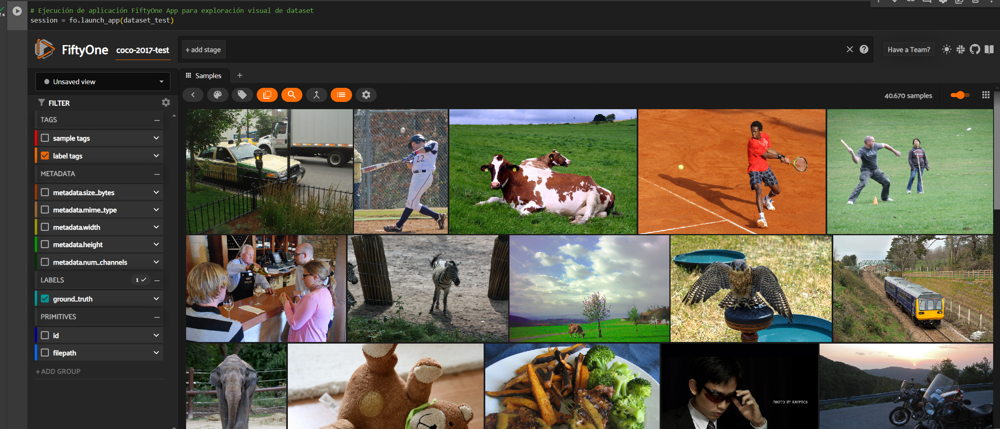

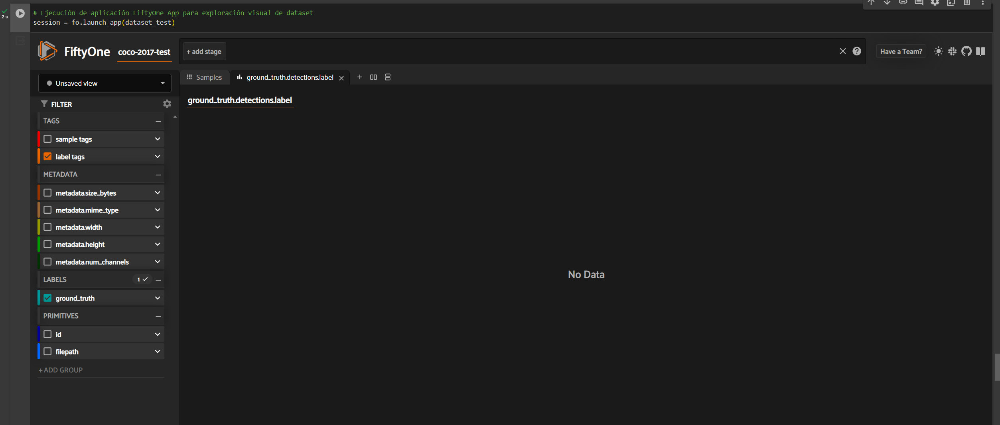

#3 - Análisis Exploratorio de Datos

## Clustering Analysis

**Análisis sobre validation dataset**

## Preguntas de Análisis

**3.1 - ¿Cuáles son las estadísticas resumidas del conjunto de datos?**

**3.2 - ¿Cuál es la distribución de clases en el conjunto de datos?**

**3.3 - ¿Se deberían normalizar las imágenes para visualizarlas mejor?**

**3.4 - ¿Cuál es la variabilidad en términos de tamaño y resolución de las imágenes en el dataset?**

**¿Existen imágenes de diferentes dimensiones o calidad que puedan afectar el rendimiento del modelo?**

**3.5 - ¿Qué tipo de anotaciones están disponibles en el dataset**

**3.6 - ¿Qué estrategias de preprocesamiento podrían ser útiles para mejorar la detección del color en el dataset?**

**¿Es necesario realizar correcciones de balance de blancos, normalización de color u otras técnicas para mejorar la consistencia en la detección del color?**

#4 - Conclusiones

In [ ]:
session.freeze()

#5 - Referencias